# Before using this notebook read the following
#### <br>To use the Cloud Vision API, you must enable it for your project:
#### Check this [link to setup Cloud Vision API.](https://cloud.google.com/vision/docs/before-you-begin)

# Import the modules
#### google.cloud module for the google cloud vision api and other modules files for plotting and IO operations.

In [44]:
from google.cloud import vision
import io
import matplotlib.pyplot as plt
from IPython.display import Image

#### Implement detect_document function for detecting the text from the image by using the cloud vision API

In [45]:
def detect_document(path):
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)

    response = client.document_text_detection(image=image)
    for page in response.full_text_annotation.pages:
        for block in page.blocks:
            print('\nBlock confidence: {}\n'.format(block.confidence))

            for paragraph in block.paragraphs:
                print('Paragraph confidence: {}'.format(
                    paragraph.confidence))

                for word in paragraph.words:
                    word_text = ''.join([
                        symbol.text for symbol in word.symbols
                    ])
                    print('Word text: {} (confidence: {})'.format(
                        word_text, word.confidence))

                    for symbol in word.symbols:
                        print('\tSymbol: {} (confidence: {})'.format(
                            symbol.text, symbol.confidence))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))
    return response

#### Implement the annotate function for plotting the detected text using matplotlib

In [46]:
def annotate(result):
    from PIL import Image
    from matplotlib.patches import Polygon
    img = Image.open(imageFile)
    fig, ax = plt.subplots()
    ax.imshow(img)
    
    coOrdX=[]
    coOrdY=[]
    for page in result.full_text_annotation.pages:
        for block in page.blocks:
            for vertice in block.bounding_box.vertices:
                coOrdX.append(vertice.x)
                coOrdY.append(vertice.y)
    poly = Polygon(list(zip(coOrdX, coOrdY)), linewidth=2, edgecolor='green', facecolor='none')
    ax.add_patch(poly)
    plt.show()
                
                


In [47]:
imageFile="detect_handwriting_OCR-detect-handwriting_SMALL.png"

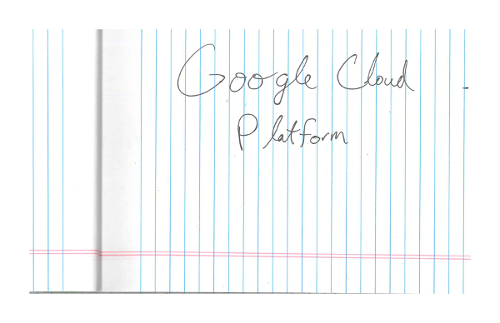

In [48]:
Image(imageFile)

In [49]:
result=detect_document(imageFile)


Block confidence: 0.893754780292511

Paragraph confidence: 0.9167048931121826
Word text: Google (confidence: 0.989648163318634)
	Symbol: G (confidence: 0.984728991985321)
	Symbol: o (confidence: 0.991116464138031)
	Symbol: o (confidence: 0.9963294267654419)
	Symbol: g (confidence: 0.9910480380058289)
	Symbol: l (confidence: 0.9875669479370117)
	Symbol: e (confidence: 0.9870989918708801)
Word text: Cloud (confidence: 0.8291730284690857)
	Symbol: C (confidence: 0.8676581978797913)
	Symbol: l (confidence: 0.9362463355064392)
	Symbol: o (confidence: 0.7873052954673767)
	Symbol: u (confidence: 0.6800588965415955)
	Symbol: d (confidence: 0.8745964765548706)
Paragraph confidence: 0.8621983528137207
Word text: Platform (confidence: 0.8621983528137207)
	Symbol: P (confidence: 0.6394678950309753)
	Symbol: l (confidence: 0.7058737874031067)
	Symbol: a (confidence: 0.8146386742591858)
	Symbol: t (confidence: 0.9121209383010864)
	Symbol: f (confidence: 0.9278522729873657)
	Symbol: o (confidence: 0

In [50]:
for page in result.full_text_annotation.pages:
    print(page.property.detected_languages)

[language_code: "en"
confidence: 1
]


In [51]:
print("WORDS DETECTED FROM IMAGE:")
for words in result.text_annotations:
    print(words.description)
    

WORDS DETECTED FROM IMAGE:
Google Cloud
Platform
Google
Cloud
Platform


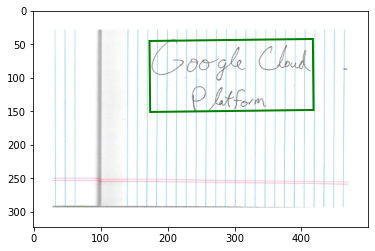

In [52]:
annotate(result)

In [66]:
imageFile="hindiTest.jpeg"

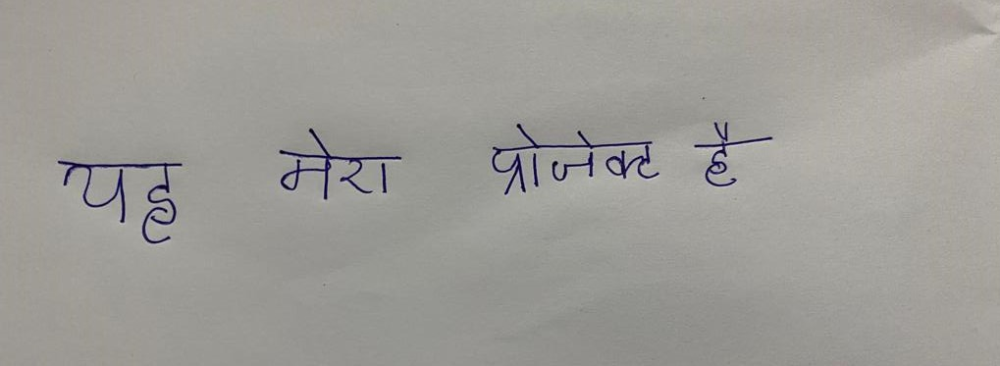

In [67]:
Image(imageFile)

In [68]:
result=detect_document(imageFile)


Block confidence: 0.9896780252456665

Paragraph confidence: 0.9896780252456665
Word text: यह (confidence: 0.9896780252456665)
	Symbol: य (confidence: 0.991659939289093)
	Symbol: ह (confidence: 0.9876960515975952)

Block confidence: 0.9634953141212463

Paragraph confidence: 0.9634953141212463
Word text: मेरा (confidence: 0.9878958463668823)
	Symbol: मे (confidence: 0.9835496544837952)
	Symbol: रा (confidence: 0.9922419786453247)
Word text: प्रोजेक्ट (confidence: 0.9460099935531616)
	Symbol: प्रो (confidence: 0.9679659008979797)
	Symbol: जे (confidence: 0.9495843052864075)
	Symbol: क्ट (confidence: 0.9204797744750977)
Word text: है (confidence: 0.9671502709388733)
	Symbol: है (confidence: 0.9671502709388733)


In [69]:
for page in result.full_text_annotation.pages:
    print(page.property.detected_languages)

[language_code: "hi"
confidence: 0.744939148
]


In [70]:
print("WORDS DETECTED FROM IMAGE:")
for words in result.text_annotations:
    print(words.description)
    

WORDS DETECTED FROM IMAGE:
यह
मेरा प्रोजेक्ट है
यह
मेरा
प्रोजेक्ट
है


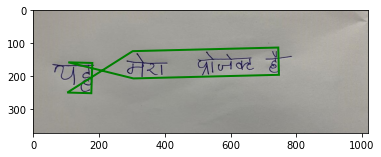

In [71]:
annotate(result)

In [59]:
imageFile="malayalamTest.png"


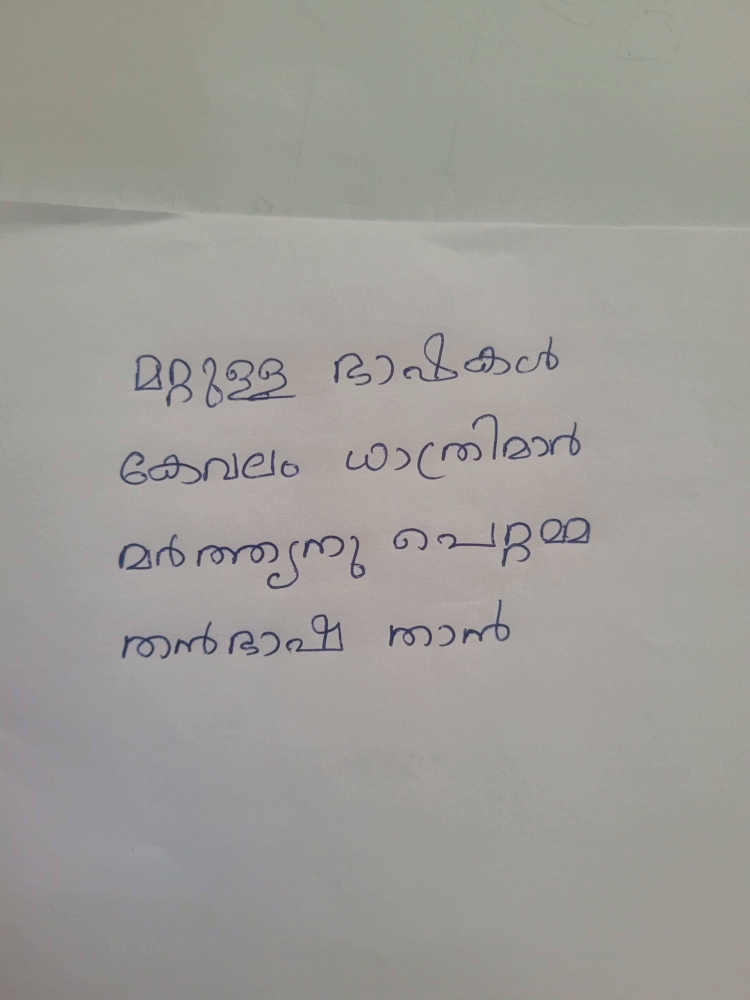

In [60]:
Image(imageFile)

In [61]:
result=detect_document(imageFile)


Block confidence: 0.6198631525039673

Paragraph confidence: 0.6198631525039673
Word text: മറ്റുള്ള (confidence: 0.8555367588996887)
	Symbol: മ (confidence: 0.8172088265419006)
	Symbol: റ്റു (confidence: 0.8990538716316223)
	Symbol: ള്ള (confidence: 0.850347638130188)
Word text: ഭാഷകൾ (confidence: 0.6317702531814575)
	Symbol: ഭാ (confidence: 0.35956549644470215)
	Symbol: ഷ (confidence: 0.46521592140197754)
	Symbol: ക (confidence: 0.8733677864074707)
	Symbol: ൾ (confidence: 0.8289317488670349)
Word text: കേവലം (confidence: 0.8912217617034912)
	Symbol: കേ (confidence: 0.7927815318107605)
	Symbol: വ (confidence: 0.9185965657234192)
	Symbol: ലം (confidence: 0.9622872471809387)
Word text: ധാതിമാർ (confidence: 0.5703134536743164)
	Symbol: ധാ (confidence: 0.7693740129470825)
	Symbol: തി (confidence: 0.35412803292274475)
	Symbol: മാ (confidence: 0.45947006344795227)
	Symbol: ർ (confidence: 0.6982818245887756)
Word text: മർത്ത്യനു (confidence: 0.7221801280975342)
	Symbol: മ (confidence: 0.58292

In [62]:
for page in result.full_text_annotation.pages:
    print(page.property.detected_languages)

[language_code: "ml"
confidence: 1
]


In [63]:
print("WORDS DETECTED FROM IMAGE:")
for words in result.text_annotations:
    print(words.description)
    

WORDS DETECTED FROM IMAGE:
മറ്റുള്ള ഭാഷകൾ
കേവലം ധാതിമാർ
മർത്ത്യനു പെറ്റമ്മ
തൻഭാഷ താൻ
മറ്റുള്ള
ഭാഷകൾ
കേവലം
ധാതിമാർ
മർത്ത്യനു
പെറ്റമ്മ
തൻഭാഷ
താൻ


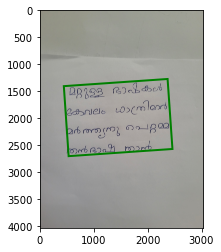

In [64]:
annotate(result)

###### Project Done by [Athul Jomon](https://github.com/AthulJomon)